# Caricamento dei moduli

In [12]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

Matplotlib is building the font cache; this may take a moment.


In [33]:
label_free_path = "../Materiale/Prove/non_colorato.png"
stained_path = "../Materiale/Prove/colorato.png"

label_free = cv2.imread(label_free_path)
stained = cv2.imread(stained_path)

label_free_gray = cv2.cvtColor(label_free, cv2.COLOR_BGR2GRAY)
stained_gray = cv2.cvtColor(stained, cv2.COLOR_BGR2GRAY)

label_free_normalized = cv2.equalizeHist(label_free_gray)
stained_normalized = cv2.equalizeHist(stained_gray)

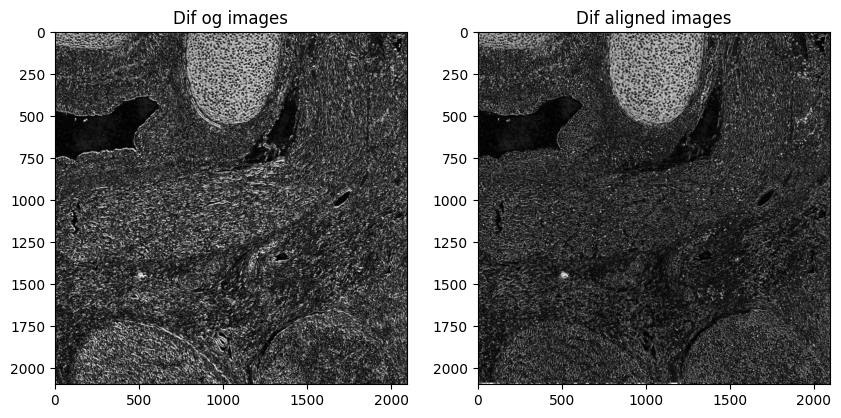

In [36]:
# Initialize the warp matrix
warp_mode = cv2.MOTION_TRANSLATION
warp_matrix = np.eye(2, 3, dtype=np.float32)

# Set the stopping criteria
criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 5000, 1e-10)

# Run the ECC algorithm
cc, warp_matrix = cv2.findTransformECC(label_free_normalized, stained_normalized, warp_matrix, warp_mode, criteria)

# Align the stained image
h, w = label_free_normalized.shape
aligned_stained = cv2.warpAffine(stained_normalized, warp_matrix, (w, h), flags=cv2.INTER_LINEAR + cv2.WARP_INVERSE_MAP)

# Compute the difference
difference_og = cv2.absdiff(label_free_normalized, stained_normalized)
difference_aligned = cv2.absdiff(label_free_normalized, aligned_stained)

# Show the difference
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("Dif og images")
plt.imshow(difference_og, cmap='gray')
plt.subplot(1, 2, 2)
plt.title("Dif aligned images")
plt.imshow(difference_aligned, cmap='gray')
plt.show()

In [147]:
# If needed, define SIFT and BFMatcher
sift = cv2.SIFT_create(nfeatures=10000)
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

# Detect keypoints and compute descriptors
keypoints_1, descriptors_1 = sift.detectAndCompute(label_free_normalized, None)
keypoints_2, descriptors_2 = sift.detectAndCompute(stained_normalized, None)

# Match descriptors
matches = bf.match(descriptors_1, descriptors_2)
print("Number of matches: ", len(matches))
matches = sorted(matches, key=lambda x: x.distance)

# Extract matching keypoint coordinates
pts_label_free = []
pts_stained = []
for m in matches:
    pts_label_free.append(keypoints_1[m.queryIdx].pt)
    pts_stained.append(keypoints_2[m.trainIdx].pt)

Number of matches:  3314


In [115]:
filtered_matches = matches[:10]

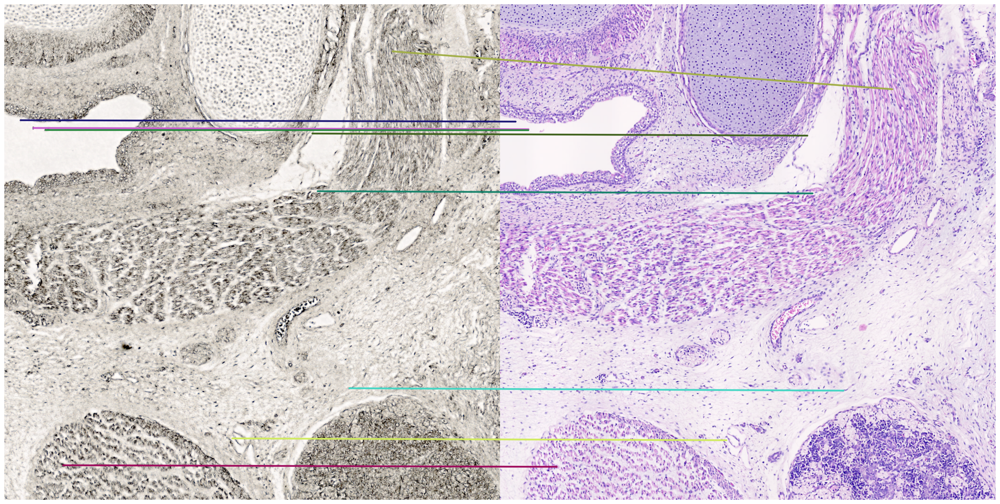

In [116]:
pts_label_free = np.float32(pts_label_free)
pts_stained = np.float32(pts_stained)

drawn_matches = cv2.drawMatches(
    label_free, keypoints_1,
    stained, keypoints_2,
    filtered_matches,
    None,
    flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS,
    matchesThickness=5
)
plt.figure(figsize=(30, 15))
plt.imshow(drawn_matches[..., ::-1])
plt.axis('off')
plt.show()

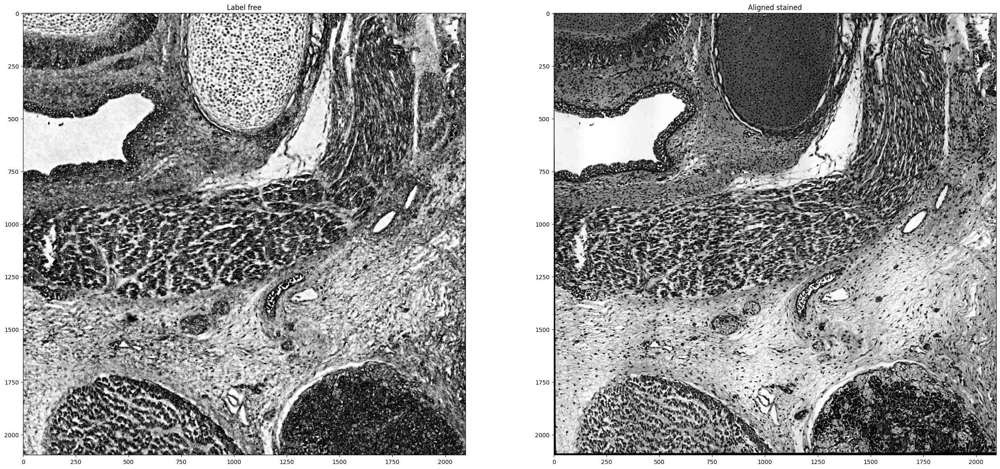

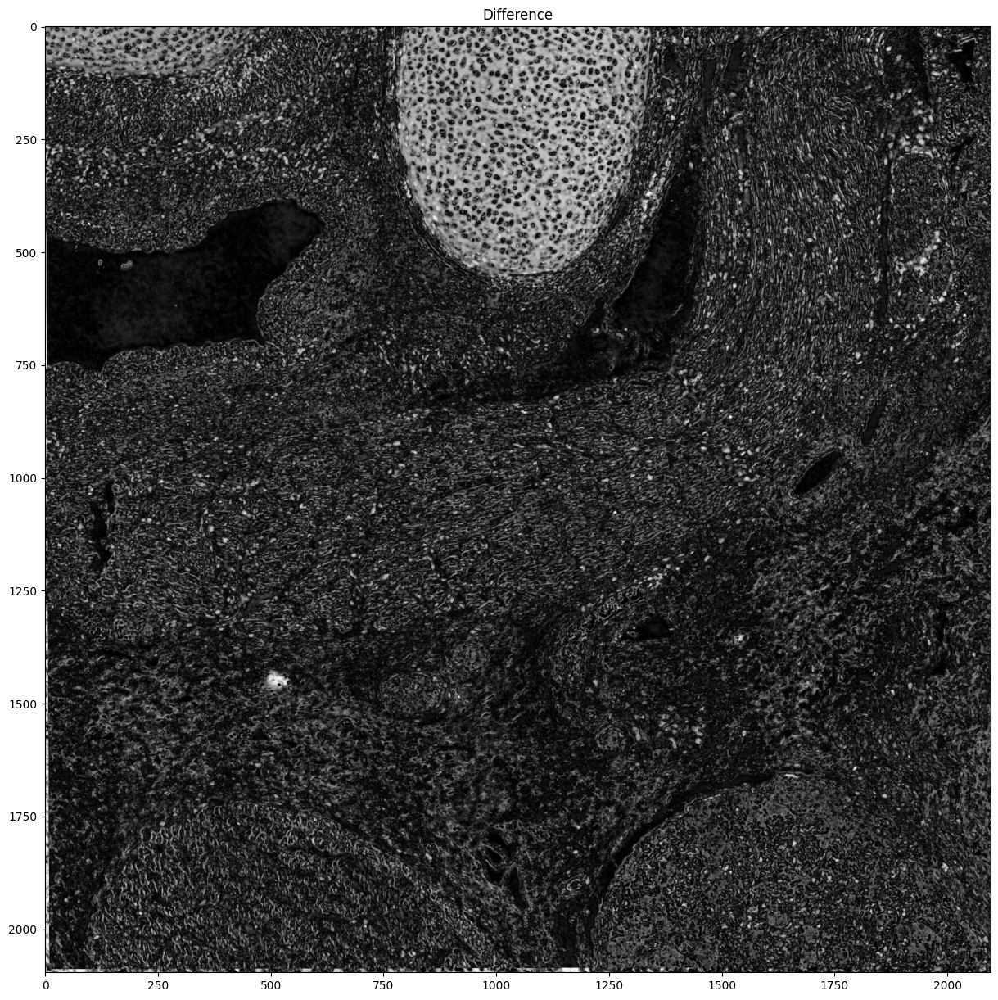

In [148]:
pts1 = np.float32([keypoints_1[m.queryIdx].pt for m in filtered_matches]).reshape(-1,1,2)
pts2 = np.float32([keypoints_2[m.trainIdx].pt for m in filtered_matches]).reshape(-1,1,2)
H, mask = cv2.findHomography(pts2, pts1, cv2.RANSAC, 5.0)

height, width = label_free.shape[:2]
aligned_stained = cv2.warpPerspective(stained, H, (width, height))
aligned_stained_gray = cv2.cvtColor(aligned_stained, cv2.COLOR_BGR2GRAY)
aligned_stained_normalized = cv2.equalizeHist(aligned_stained_gray)

difference = cv2.absdiff(label_free_normalized, aligned_stained_normalized)

plt.figure(figsize=(30, 15))
plt.subplot(1, 2, 1)
plt.title("Label free")
plt.imshow(label_free_normalized, cmap='gray')
plt.subplot(1, 2, 2)
plt.title("Aligned stained")
plt.imshow(aligned_stained_normalized, cmap='gray')
plt.show()
plt.figure(figsize=(30, 15))
plt.title("Difference")
plt.imshow(difference, cmap='gray')
plt.show()